# Outliers detection
## Instructions

<img src="./img/anomaly_detection_exercise_page2.png" alt="dataset" width="600"/>
<img src="./img/anomaly_detection_exercise_page3.png" alt="problem" width="600"/>


## Required imports

In [87]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import display

In [47]:
# Defining default matplotlib colors as a list of hex colors
mplt_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
              '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
              '#bcbd22', '#17becf']

# Dataset exploration

In [92]:
# Read dataset from csv file add store it into a pandas DataFrame 
df = pd.read_csv('data/dataset.csv')
# Quick look at the data set structure and some statistics
display(df.iloc[98:102], df.describe())

,day_cycle_window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
98,1_1_1,-1.803653,-2.471177,-2.634293,-2.876569,-2.890035,-1.249249,-2.474981,-0.640280,2.690807,-1.938069,-3.132566
99,1_1_1,-1.804485,-2.471116,-2.634234,-2.875820,-2.888859,-1.249249,-2.474815,-0.640413,2.690991,-1.938111,-3.132542
100,1_1_2,-1.811775,-2.471116,-2.634234,-2.875820,-2.888859,-1.249249,-2.474815,-0.640413,2.690991,-1.938111,-3.132542
101,1_1_2,-1.821870,-2.471116,-2.616262,-2.875820,-2.888859,-1.249249,-2.474815,-0.640413,2.690991,-1.938111,-3.132542


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
count,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000,162702.000000
mean,0.000009,0.000011,0.000031,0.000005,0.000016,-0.000005,-0.000002,0.000003,-0.000021,0.000026,0.000030
std,0.999950,0.999925,0.999961,0.999925,0.999963,0.999926,0.999950,0.999949,0.997770,0.999686,0.999847
min,-3.211980,-3.395387,-3.325651,-3.378450,-3.281286,-4.200181,-3.898025,-3.524957,-13.704556,-12.044778,-3.183571
25%,-0.678808,-0.482716,-0.629123,-0.491585,-0.612334,-0.559023,-0.606135,-0.736398,-0.593096,-0.498480,-0.658530
50%,0.041883,0.180360,0.041442,0.147397,0.117040,0.153972,0.186038,-0.012354,-0.034882,-0.257635,-0.015437
75%,0.743973,0.656920,0.659246,0.636887,0.712393,0.685353,0.718237,0.802395,0.508232,0.359773,0.636740
max,5.013899,6.260782,8.652950,8.359670,6.424227,5.638259,3.735957,4.667058,8.203706,5.597387,9.204384


First observation, all the features are almost reduced and centered ($\mu\approx0$ and $\sigma\approx1$). Second, there is the same amount of data for each features.

In [93]:
# Define some useful labels
wlabel = 'day_cycle_window'
feature_labels = df.columns.values
feature_labels = np.delete(feature_labels, 0)
print(f"{feature_labels=}")

feature_labels=array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11'],
      dtype=object)


Text(0.5, 1.0, 'Boxplot of all the features')

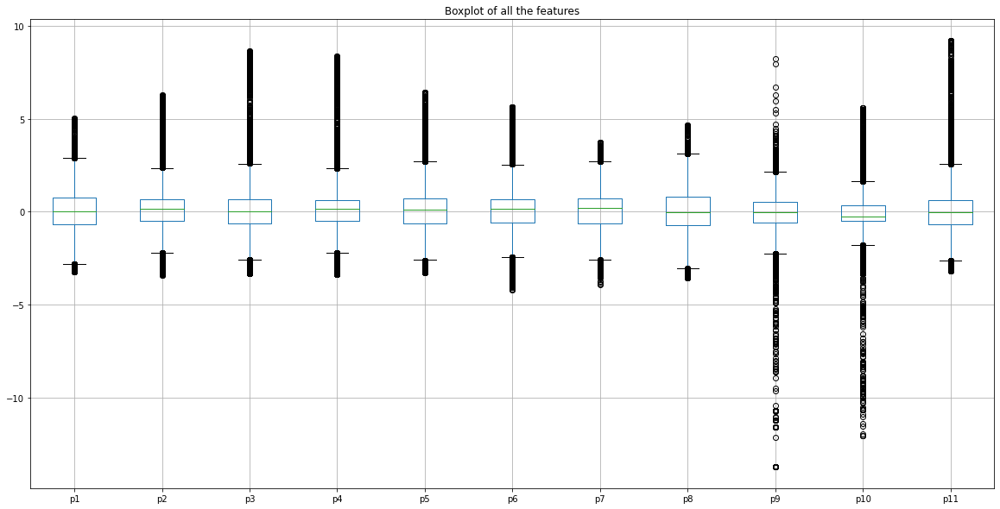

In [273]:
ax = df[feature_labels].boxplot(figsize=(20,10), return_type='axes')
ax.set_title("Boxplot of all the features")

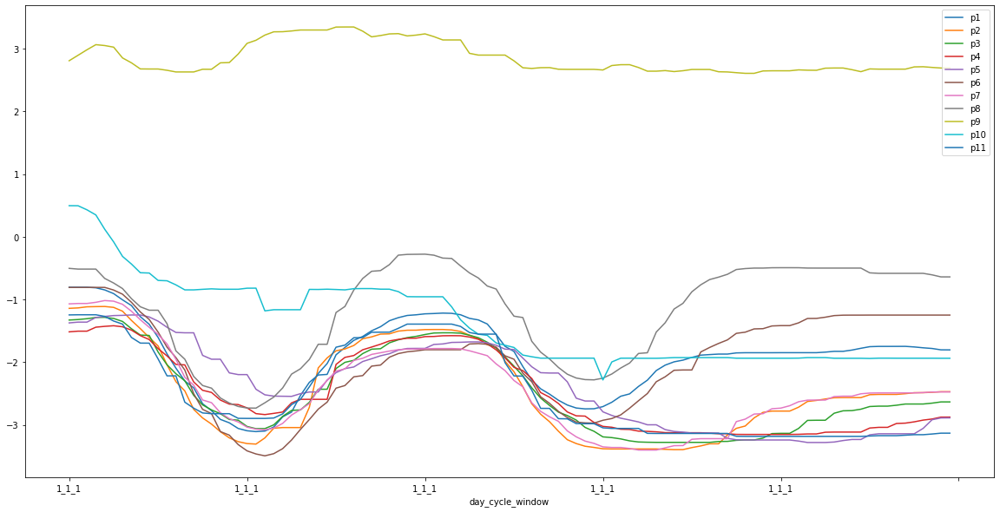

In [277]:
# Look at window 1 to see what the data lokks like
w_1_1_1 = df.set_index('day_cycle_window').loc['1_1_1']
w_1_1_1[feature_labels].plot(figsize=(20, 10))

In [104]:
%%time
def split_dcw(s):
    dcw = s.split('_')
    return pd.Series({'day':int(dcw[0]), 'cycle':int(dcw[1]), 'window':int(dcw[2])})

# Add 'day', 'cycle' and 'windows' columns to df by parsing 'day_cycle_window'column
df = df.merge(df.day_cycle_window.apply(split_dcw), left_index=True, right_index=True)
# Re-order columns 
cols = df.columns.tolist()
cols = [cols[0]] + cols[-3:] + cols[1:-3]
df = df[cols] 
# Sort rows by 'day', 'cycle', 'window' in this order.
df = df.sort_values(['day', 'cycle', 'window']).reset_index(drop=True)
# Visualize the result
df.head(2)

,day_cycle_window,day,cycle,window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
0,1_1_1,1,1,1,-0.805191,-1.141993,-1.328327,-1.516693,-1.373962,-0.80827,-1.070547,-0.504352,2.807146,0.495528,-1.246737
1,1_1_1,1,1,1,-0.805191,-1.134902,-1.320393,-1.505848,-1.361560,-0.80784,-1.064212,-0.516000,2.894177,0.494467,-1.244472


In [313]:
display("Numbers of windows per cycle and per day",
mdf.groupby(['day', 'cycle']).agg(nb_windows=pd.NamedAgg(column="p1", aggfunc="count")).transpose(), 
mdf.groupby(['day']).agg(nb_windows=pd.NamedAgg(column="p1", aggfunc="count")).transpose())

'Numbers of windows per cycle and per day'

day          1                    2             3            4              
cycle        1    2  3   4   5    1   2    3    1   2    3   1    2   3    4
nb_windows  68  181  6  17  94  181  76  145  181  52  181  49  181  65  160

day,1,2,3,4
nb_windows,366,402,414,455


In [164]:
windows_count = df.groupby(['day', 'cycle', 'window', 'day_cycle_window'])[feature_labels].count()
windows_count

p1   p2   p3   p4   p5   p6   p7   p8  \
day cycle window day_cycle_window                                           
1   1     1      1_1_1             100  100  100  100  100  100  100  100   
          2      1_1_2             100  100  100  100  100  100  100  100   
          3      1_1_3             100  100  100  100  100  100  100  100   
          4      1_1_4             100  100  100  100  100  100  100  100   
          5      1_1_5             100  100  100  100  100  100  100  100   
...                                ...  ...  ...  ...  ...  ...  ...  ...   
4   4     156    4_4_156           100  100  100  100  100  100  100  100   
          157    4_4_157           100  100  100  100  100  100  100  100   
          158    4_4_158           100  100  100  100  100  100  100  100   
          159    4_4_159           100  100  100  100  100  100  100  100   
          160    4_4_160            76   76   76   76   76   76   76   76   

                                    p9  p10  p11  
day cycle window day_cycle_window                 
1   1     1      1_1_1             100  100  100  
          2      1_1_2             100  100  100  
          3      1_1_3             100  100  100  
          4      1_1_4             100  100  100  
          5      1_1_5             100  100  100  
...                                ...  ...  ...  
4   4     156    4_4_156           100  100  100  
          157    4_4_157           100  100  100  
          158    4_4_158           100  100  100  
          159    4_4_159           100  100  100  
          160    4_4_160            76   76   76  

[1637 rows x 11 columns]

In [165]:
for i in range(len(feature_labels)-1):
    if np.setdiff1d(windows_count[feature_labels[i]], windows_count[feature_labels[i+1]]).shape[0] > 0:
        print(f"Difference between feature {feature_labels[i]} and {feature_lbabels[i+1]}")
    else:
        print(f"No difference between feature {feature_labels[i]} and {feature_labels[i+1]}")

No difference between feature p1 and p2
No difference between feature p2 and p3
No difference between feature p3 and p4
No difference between feature p4 and p5
No difference between feature p5 and p6
No difference between feature p6 and p7
No difference between feature p7 and p8
No difference between feature p8 and p9
No difference between feature p9 and p10
No difference between feature p10 and p11


We found that the number of data points for each window is the same for all the features $[p1, p2, ..., p9]$

It seems that, in general, there is $100$ data per window, __but__ it seems that there is some windows with less than $100$ data. Let's explore those windows.

In [171]:
# Look at windows with not 100 values
unique_values, counts = np.unique(windows_count.p1, return_counts=True)
for v, c in zip(unique_values, counts):
    print(f"{c} windows with {v} data points")

print(f"\nThere is {windows_count.p1.shape[0]-counts[-1]} windows with less than 100 data points")
less_than_100_idxs = np.where(windows_count.p1 < 100)[0]
print("\nHere are the windows missing data")
windows_count.iloc[less_than_100_idxs]

2 windows with 2 data points
3 windows with 3 data points
2 windows with 17 data points
1 windows with 22 data points
1 windows with 32 data points
1 windows with 50 data points
1 windows with 53 data points
1 windows with 62 data points
1 windows with 75 data points
1 windows with 76 data points
1 windows with 85 data points
1622 windows with 100 data points

There is 15 windows with less than 100 data points

Here are the windows missing data


p1  p2  p3  p4  p5  p6  p7  p8  p9  p10  \
day cycle window day_cycle_window                                            
1   1     68     1_1_68            75  75  75  75  75  75  75  75  75   75   
    2     181    1_2_181            3   3   3   3   3   3   3   3   3    3   
    3     6      1_3_6             53  53  53  53  53  53  53  53  53   53   
    4     17     1_4_17            50  50  50  50  50  50  50  50  50   50   
    5     94     1_5_94            17  17  17  17  17  17  17  17  17   17   
2   1     181    2_1_181            2   2   2   2   2   2   2   2   2    2   
    2     76     2_2_76            62  62  62  62  62  62  62  62  62   62   
    3     145    2_3_145           32  32  32  32  32  32  32  32  32   32   
3   1     181    3_1_181            3   3   3   3   3   3   3   3   3    3   
    2     52     3_2_52            17  17  17  17  17  17  17  17  17   17   
    3     181    3_3_181            2   2   2   2   2   2   2   2   2    2   
4   1     49     4_1_49            85  85  85  85  85  85  85  85  85   85   
    2     181    4_2_181            3   3   3   3   3   3   3   3   3    3   
    3     65     4_3_65            22  22  22  22  22  22  22  22  22   22   
    4     160    4_4_160           76  76  76  76  76  76  76  76  76   76   

                                   p11  
day cycle window day_cycle_window       
1   1     68     1_1_68             75  
    2     181    1_2_181             3  
    3     6      1_3_6              53  
    4     17     1_4_17             50  
    5     94     1_5_94             17  
2   1     181    2_1_181             2  
    2     76     2_2_76             62  
    3     145    2_3_145            32  
3   1     181    3_1_181             3  
    2     52     3_2_52             17  
    3     181    3_3_181             2  
4   1     49     4_1_49             85  
    2     181    4_2_181             3  
    3     65     4_3_65             22  
    4     160    4_4_160            76

In [220]:
less_than_100_wlabels = windows_count.iloc[less_than_100_idxs].index.get_level_values('day_cycle_window')
less_than_100_wlabels

Index(['1_1_68', '1_2_181', '1_3_6', '1_4_17', '1_5_94', '2_1_181', '2_2_76',
       '2_3_145', '3_1_181', '3_2_52', '3_3_181', '4_1_49', '4_2_181',
       '4_3_65', '4_4_160'],
      dtype='object', name='day_cycle_window')

### Visualize windows with less than 100 data points

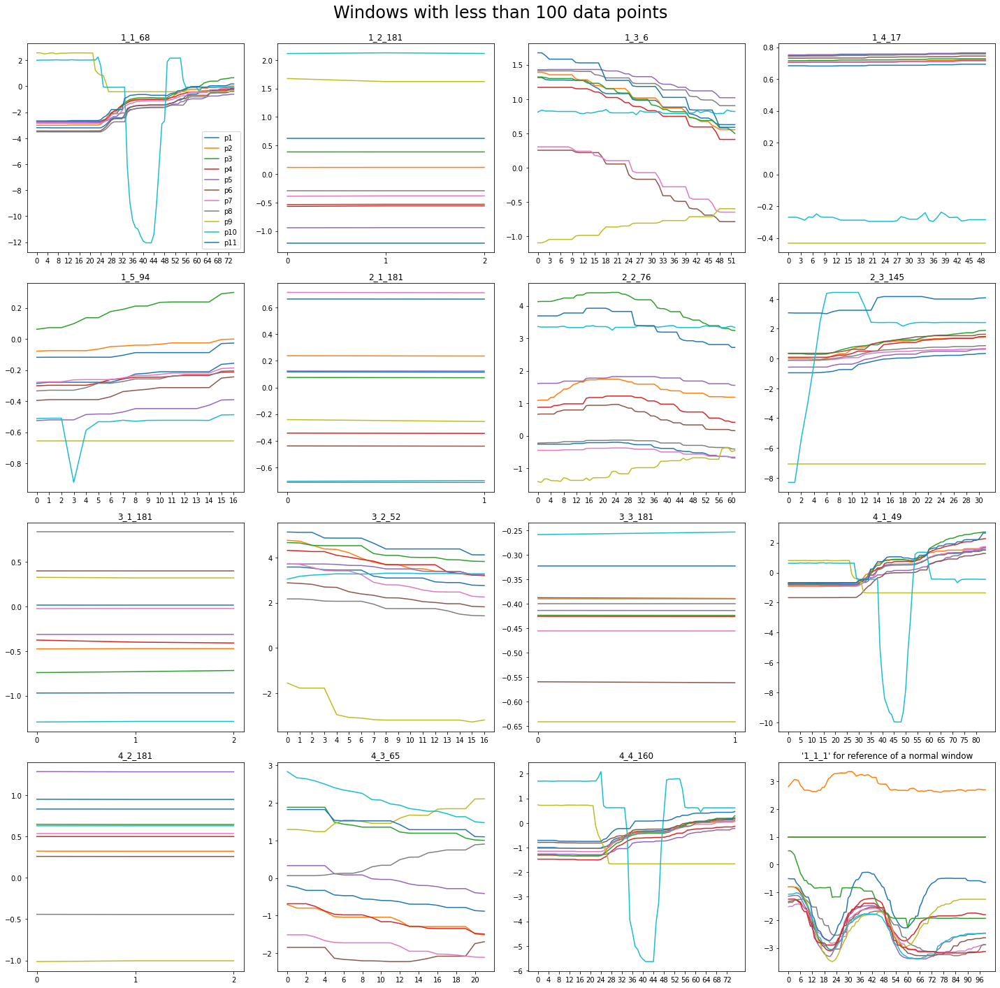

In [287]:
n = less_than_100_wlabels.shape[0]
nrows = n//4 + 1*(n%4 > 0)
fig, axs = plt.subplots(nrows, 4, figsize=(20,20))
fig.suptitle("Windows with less than 100 data points", fontsize=24)
for i, (label, grouped) in enumerate(df.set_index('day_cycle_window').loc[less_than_100_wlabels][feature_labels].groupby('day_cycle_window')):
    ax = axs[i//4, i%4]
    ax.set_title(label)
    grouped.plot(ax=ax, legend=i==0, use_index=False, xticks=range(0,grouped.p1.shape[0], 1+grouped.p1.shape[0]//20))

w_1_1_1.plot(ax=axs[nrows-1,3], legend=False, use_index=False, xticks=range(0,w_1_1_1.p1.shape[0], 1+w_1_1_1.p1.shape[0]//20))
axs[nrows-1,3].set_title("'1_1_1' for reference of a normal window")
fig.tight_layout(rect=[0, 0, 1, 0.96])

# Visualize data

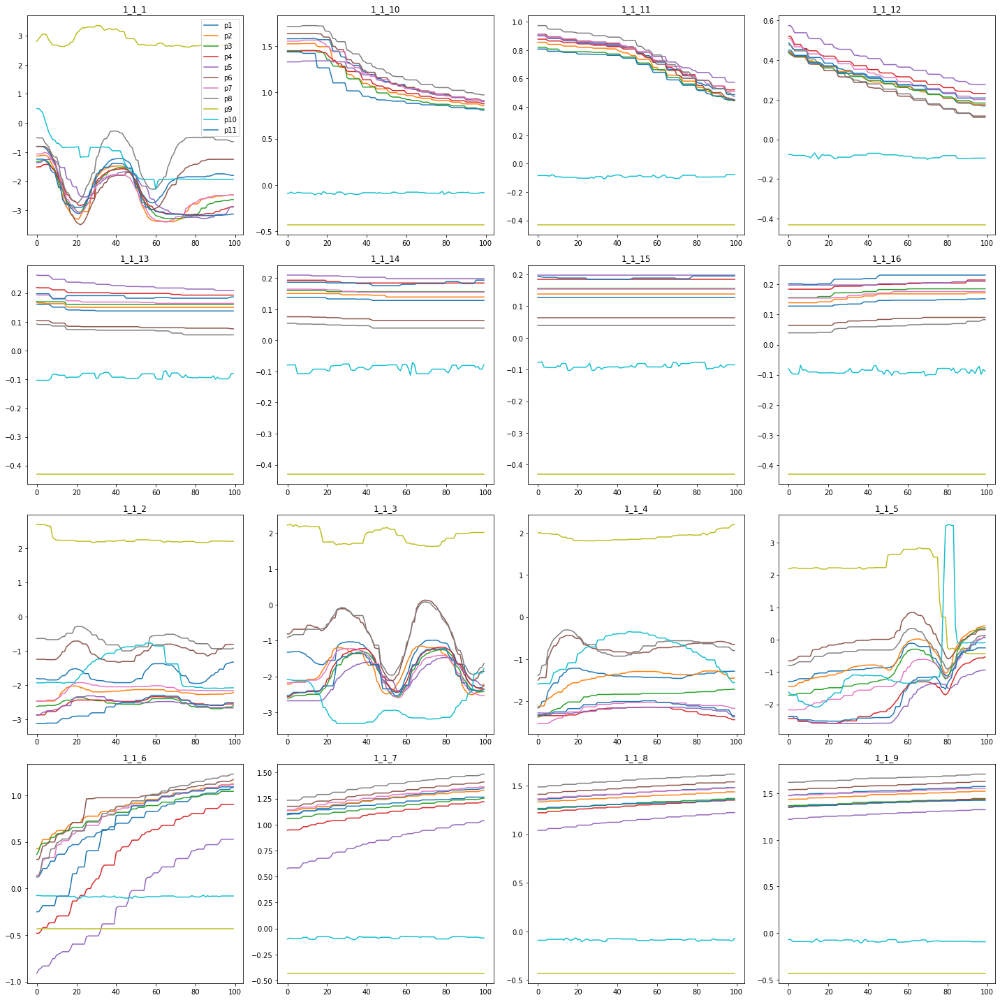

In [334]:
n = 16
nrows = n//4 + 1*(n%4 > 0)
fig, axs = plt.subplots(nrows, 4, figsize=(20,20))
for i, (label, grouped) in enumerate(df.set_index('day_cycle_window').loc[df.day_cycle_window.unique()[:16]][feature_labels].groupby('day_cycle_window')):
    ax = axs[i//4, i%4]
    ax.set_title(label)
    grouped.plot(ax=ax, legend=i==0, use_index=False)

fig.tight_layout()

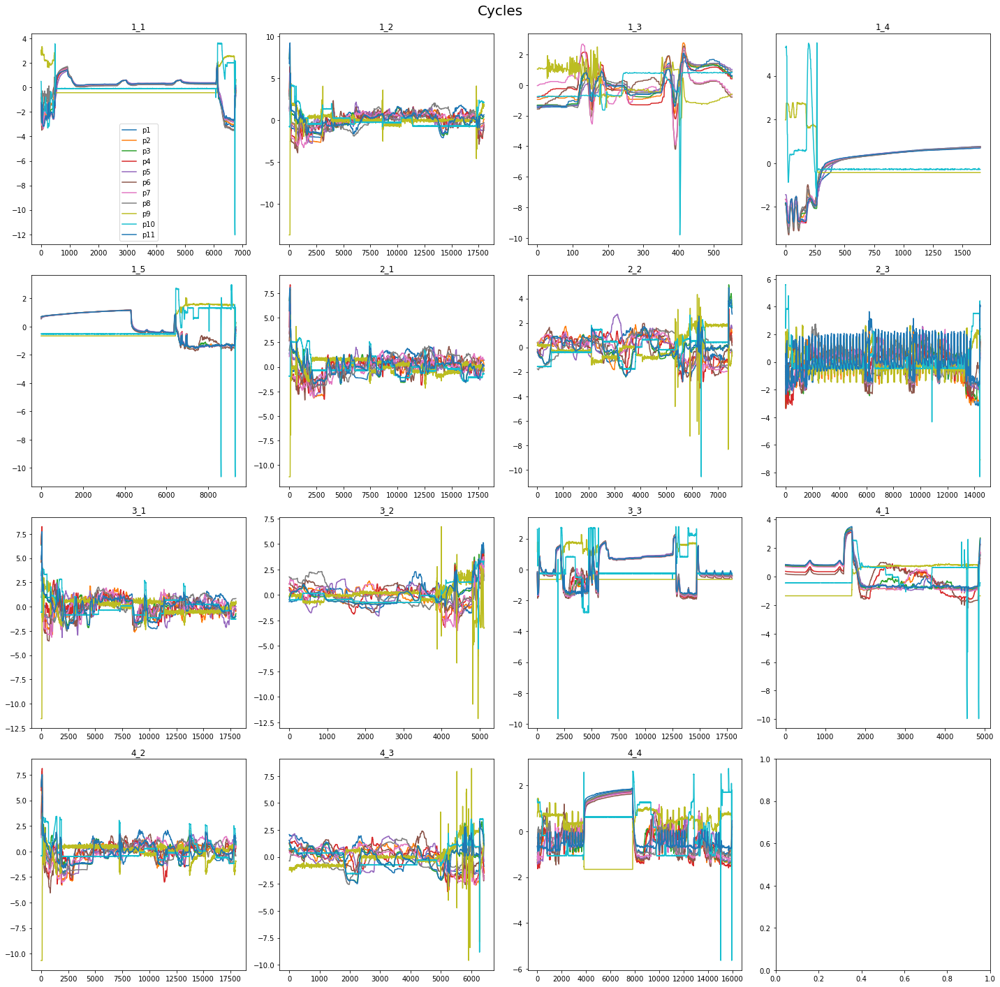

In [333]:
# look like we better plot the data by cycle
dc_df = df.groupby(['day', 'cycle'])
n = len(dc_df.groups)
nrows = n//4 + 1*(n%4 > 0)
fig, axs = plt.subplots(nrows, 4, figsize=(20,20))
fig.suptitle("Cycles", fontsize=20)
for i, (label, grouped) in enumerate(dc_df):
    grouped = grouped[feature_labels]
    ax = axs[i//4, i%4]
    ax.set_title(f"{label[0]}_{label[1]}")
    grouped.plot(ax=ax, legend=i==0, use_index=False)

fig.tight_layout(rect=[0, 0, 1, 0.97])

# Grouping the data per window using the mean
Now that we have deal with the raw data and remove the window that are not uniform with the dataset in term of number of data points. 

One idea is to consider the feature by averaging on the windows, to easily compare the windows based on those means.

In [100]:
mdf = df.groupby(['day_cycle_window']).mean()
mdf = mdf.reset_index()
mdf.head(2)

,day_cycle_window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
0,1_1_1,-1.926141,-2.456284,-2.487394,-2.481230,-2.388674,-1.984092,-2.447148,-1.169837,2.848242,-1.370045,-2.500060
1,1_1_10,1.204735,1.123558,1.077596,1.128253,1.136183,1.228688,1.199106,1.308412,-0.429810,-0.088168,1.016565


In [101]:
def split_dcw(s):
    dcw = s.split('_')
    return pd.Series({'day':int(dcw[0]), 'cycle':int(dcw[1]), 'window':int(dcw[2])})

mdf = mdf.merge(mdf.day_cycle_window.apply(split_dcw), left_index=True, right_index=True)

cols = mdf.columns.tolist()
cols = [cols[0]] + cols[-3:] + cols[1:-3]
mdf = mdf[cols] 
mdf = mdf.sort_values(['day', 'cycle', 'window']).reset_index(drop=True)
mdf

,day_cycle_window,day,cycle,window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
0,1_1_1,1,1,1,-1.926141,-2.456284,-2.487394,-2.481230,-2.388674,-1.984092,-2.447148,-1.169837,2.848242,-1.370045,-2.500060
1,1_1_2,1,1,2,-1.714067,-2.217161,-2.530537,-2.515985,-2.544961,-1.040076,-2.127244,-0.700150,2.246956,-1.545889,-2.654753
2,1_1_3,1,1,3,-1.534357,-1.779994,-1.938747,-1.835152,-2.053982,-0.866705,-1.859002,-0.837695,1.903785,-2.853705,-1.926807
3,1_1_4,1,1,4,-1.415197,-1.453962,-1.888438,-2.249327,-2.206560,-0.732366,-2.144090,-0.687389,1.915830,-0.828060,-2.117340
4,1_1_5,1,1,5,-0.732715,-0.634379,-0.963247,-1.871178,-2.048933,-0.004074,-1.263891,-0.316854,1.779600,-0.932193,-1.796746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1632,4_4_156,4,4,156,-0.956537,-1.347865,-1.277796,-1.489708,-1.259816,-1.174963,-1.174717,-1.033134,0.747000,1.698238,-0.708232
1633,4_4_157,4,4,157,-0.984032,-1.350121,-1.296572,-1.473924,-1.277888,-1.056938,-1.176011,-1.036529,0.781643,1.822312,-0.720395
1634,4_4_158,4,4,158,-1.006301,-1.363260,-1.319295,-1.484471,-1.289714,-0.896817,-1.177147,-1.040539,0.738953,1.777215,-0.722794
1635,4_4_159,4,4,159,-1.013992,-1.368401,-1.323755,-1.506278,-1.304717,-0.843966,-1.187889,-1.057283,0.742485,1.701126,-0.734295


In [102]:
mdf.describe()

,day,cycle,window,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11
count,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000,1637.000000
mean,2.585217,2.338424,73.597434,0.001238,0.002203,0.004516,0.001227,0.002002,-0.000175,0.000626,0.000700,-0.004657,0.004040,0.005881
std,1.116492,1.170781,50.817075,0.984739,0.972068,0.977228,0.965178,0.981063,0.973094,0.982552,0.986130,0.939800,0.938960,0.966371
min,1.000000,1.000000,1.000000,-3.161210,-3.131407,-2.786465,-3.016270,-2.938245,-3.723546,-3.156266,-3.490736,-10.536143,-2.853705,-2.654753
25%,2.000000,1.000000,30.000000,-0.656294,-0.464786,-0.627214,-0.484833,-0.609168,-0.565333,-0.589464,-0.719675,-0.575196,-0.488833,-0.641498
50%,3.000000,2.000000,64.000000,0.036949,0.178310,0.046624,0.163838,0.112851,0.155493,0.199685,-0.016729,-0.031227,-0.253862,0.021857
75%,4.000000,3.000000,115.000000,0.732917,0.636372,0.628836,0.620310,0.701837,0.665579,0.708269,0.800933,0.477545,0.356017,0.624762
max,4.000000,5.000000,181.000000,3.507462,5.173017,7.463722,7.218977,5.202062,4.685652,3.100243,3.608533,2.848242,4.121677,7.721477


In [103]:
mdf.groupby(['day', 'cycle', 'window']).count()

day_cycle_window  p1  p2  p3  p4  p5  p6  p7  p8  p9  p10  \
day cycle window                                                              
1   1     1                      1   1   1   1   1   1   1   1   1   1    1   
          2                      1   1   1   1   1   1   1   1   1   1    1   
          3                      1   1   1   1   1   1   1   1   1   1    1   
          4                      1   1   1   1   1   1   1   1   1   1    1   
          5                      1   1   1   1   1   1   1   1   1   1    1   
...                            ...  ..  ..  ..  ..  ..  ..  ..  ..  ..  ...   
4   4     156                    1   1   1   1   1   1   1   1   1   1    1   
          157                    1   1   1   1   1   1   1   1   1   1    1   
          158                    1   1   1   1   1   1   1   1   1   1    1   
          159                    1   1   1   1   1   1   1   1   1   1    1   
          160                    1   1   1   1   1   1   1   1   1   1    1   

                  p11  
day cycle window       
1   1     1         1  
          2         1  
          3         1  
          4         1  
          5         1  
...               ...  
4   4     156       1  
          157       1  
          158       1  
          159       1  
          160       1  

[1637 rows x 12 columns]

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fef019483d0>,
      dtype=object)

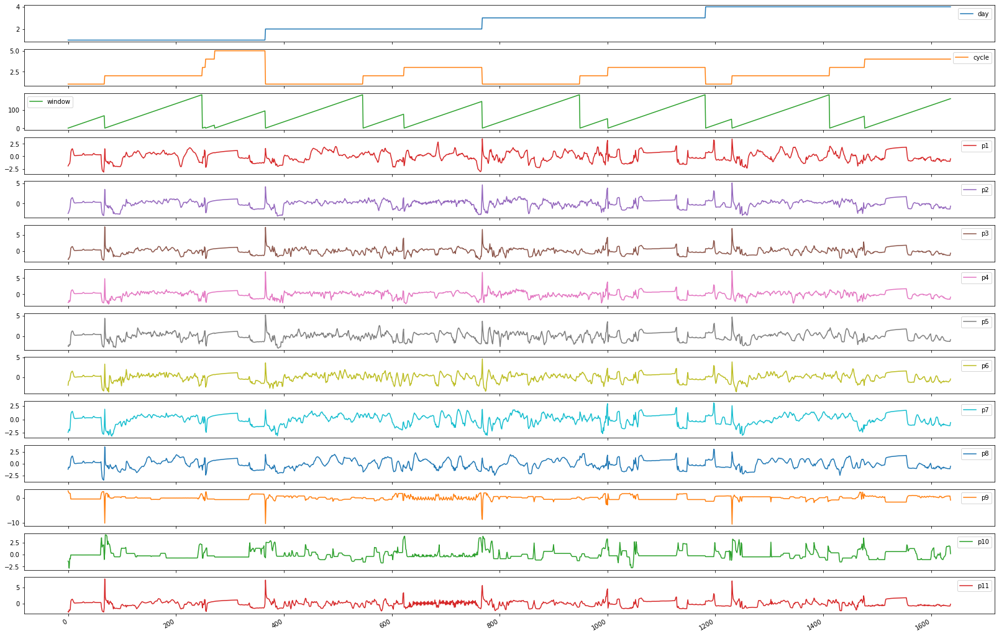

In [32]:
mdf.plot(figsize=(28, 20), subplots=True)

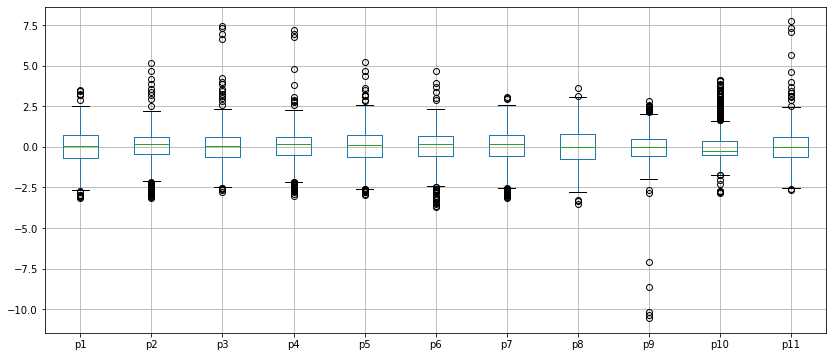

In [21]:
mdf[feature_labels].boxplot(figsize=(14,6))

In [67]:
def anomalies_mad(serie):
    print(serie.shape)
    med = serie.median()
    mad = (serie - med).abs().median()
    anomalies = serie[(serie - med).abs() > 4*mad].copy()
    return anomalies

def color_serie(serie, anomalies):
    return ['red' if v in anomalies.values else mplt_colors[0] for v in serie.values]

p9_anomalies = anomalies_mad(mdf.p9)
p9_colors = color_serie(mdf.p9, p9_anomalies)
print(p9_anomalies.shape)
np.unique(p9_colors, return_counts=True)

(1637,)
(20,)


(array(['#1f77b4', 'red'], dtype='<U7'), array([1617,   20]))

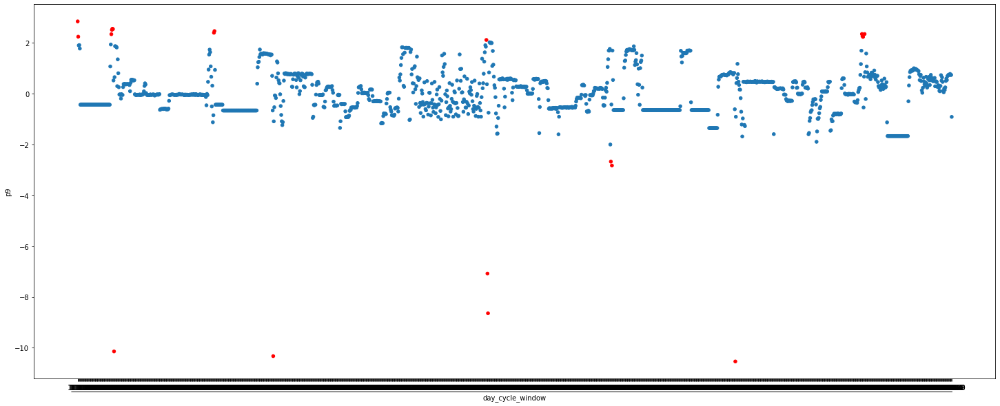

In [68]:
mdf.plot(x='day_cycle_window', y= 'p9', figsize=(25, 10), legend=True, kind='scatter', c=p9_colors, marker='o')
# plt.scatter(mdf.p9.index, mdf.p9, figsize=(20,10))

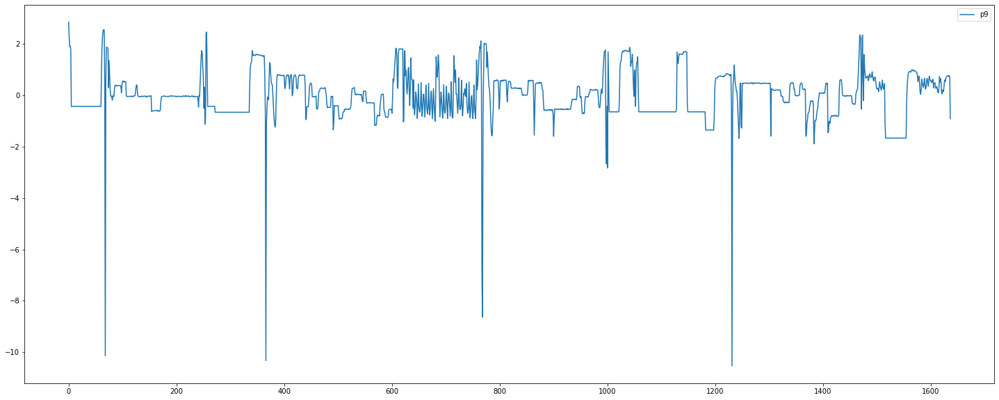

In [27]:
mdf.p9.plot(use_index=True, figsize=(25, 10), legend=True)
# mdf[['p2', 'p3', 'p4', 'p5', 'p6']].plot(use_index=True, figsize=(25, 10), legend=True)